# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [197]:
try:
    from google.colab import drive
    drive.mount('/content/drive')

    !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
    !unzip dataset.zip
except ModuleNotFoundError:
    pass

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# ASSIGNMENT:

In [198]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

models_path = "dataset/models/"
scenes_path = "dataset/scenes/"

products_A = {i: f"{models_path}ref{i}.png" for i in range(1, 15)}
products_B = {i: f"{models_path}ref{i}.png" for i in range(15, 28)}

scenes_A = {i: f"{scenes_path}scene{i}.png" for i in range(1, 6)}
scenes_B = {i: f"{scenes_path}scene{i}.png" for i in range(6, 13)}

### Show the dataset

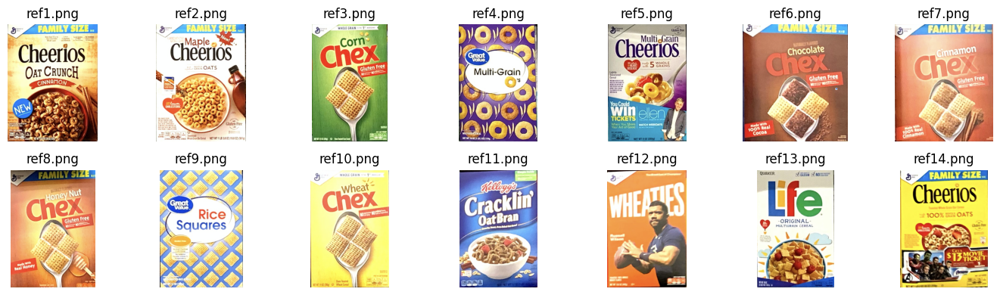

In [199]:
fig, axes = plt.subplots(2, 7, figsize=(14, 4))
axes = axes.flatten()

for i, product in enumerate(products_A):
    axes[i].imshow(cv2.cvtColor(cv2.imread(products_A[product]), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(products_A[product][len(models_path):])

plt.tight_layout()
plt.show()

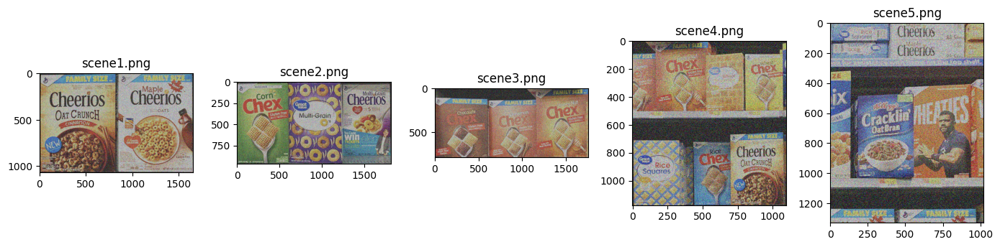

In [200]:
fig, axes = plt.subplots(1, 5, figsize=(14, 4))
axes = axes.flatten()

read_noisy_scenes_A = {}
for i, scene in enumerate(scenes_A):
    image = cv2.cvtColor(cv2.imread(scenes_A[scene]), cv2.COLOR_BGR2RGB)
    read_noisy_scenes_A[scene] = image
    axes[i].imshow(image)
    # axes[i].axis('off')
    axes[i].set_title(scenes_A[scene][len(scenes_path):])

plt.tight_layout()
plt.show()

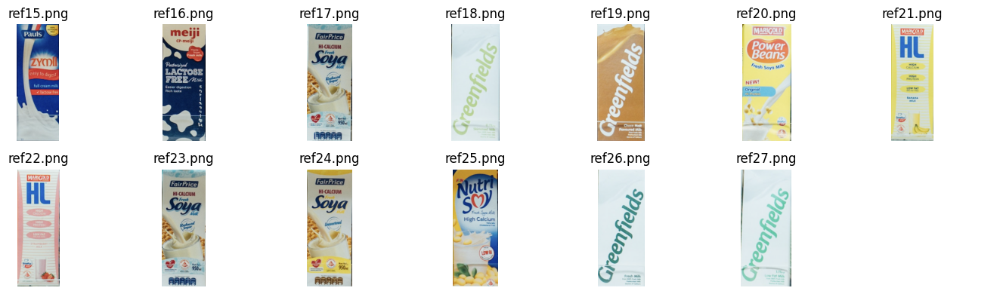

In [201]:
fig, axes = plt.subplots(2, 7, figsize=(14, 4))
axes = axes.flatten()

for i, product in enumerate(products_B):
    axes[i].imshow(cv2.cvtColor(cv2.imread(products_B[product]), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(products_B[product][len(models_path):])
    if i == len(products_B)-1:
        for ax in axes[i+1:]:
            ax.axis('off')

plt.tight_layout()
plt.show()

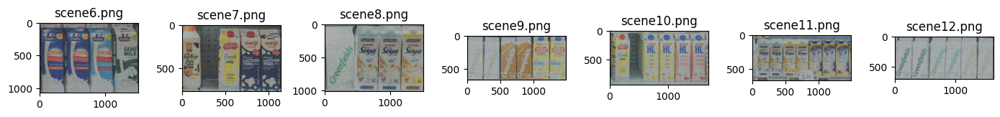

In [202]:
fig, axes = plt.subplots(1, 7, figsize=(14, 4))
axes = axes.flatten()

read_noisy_scenes_B = {}
for i, scene in enumerate(scenes_B):
    image = cv2.cvtColor(cv2.imread(scenes_B[scene]), cv2.COLOR_BGR2RGB)
    read_noisy_scenes_B[scene] = image
    axes[i].imshow(image)
    axes[i].set_title(scenes_B[scene][len(scenes_path):])

plt.tight_layout()
plt.show()

## TRACK A

Let' start by preparing a method to easily apply filters to an image...

In [203]:
def denoise_image(image, filters):
    '''
    Apply denoising filters to the input image.

    Parameters:
    image (array_like): The input image to be denoised.
    filters (list of dict): A list of dictionaries, each representing a denoising filter to be applied.
        Each dictionary should have the following keys:
            - name (str): The name of the filter.
            - n_iter (int): The number of iterations to apply the filter.
            - params (dict): A dictionary containing parameters specific to the filter.

    Returns:
    array_like: The denoised image.

    Example:
    >>> denoised_image = denoise_image(input_image, [
    >>>     {"name": "mean", "n_iter": 1, "params": {"ksize": 7}},
    >>>     {"name": "median", "n_iter": 1, "params": {"ksize": 5}},
    >>>     {"name": "bilateral", "n_iter": 1, "params": {"d": 3, "sigmaColor": 2, "sigmaSpace": 1.5}},
    >>>     {"name": "gaussian", "n_iter": 1, "params": {"sigmaX": 2}},
    >>>     {"name": "non_local_means", "n_iter": 1, "params": {"templateWindowSize": 5, "searchWindowSize": 21, "h": 3, "hColor": 20}},
    >>>     {"name": "canny", "n_iter": 1, "params": {"threshold1": 5, "threshold2": 21}},
    >>>     {"name": "sharpen", "n_iter": 1, "params": {}}, # 3x3 kernel
    >>>     {"name": "emboss", "n_iter": 1, "params": {}}   # 3x3 kernel
    >>> ])
    '''
    for filter in filters:
        for _ in range(filter['n_iter']):
            match filter['name']:
                case "mean":
                    '''
                    {"ksize" : 15}
                    '''
                    k_size = filter['params']['ksize']
                    mean_kernel = np.ones([k_size, k_size])/(k_size**2)
                    image = cv2.filter2D(image, -1, mean_kernel)
                case "median":
                    '''
                    {"ksize" : 11}
                    '''
                    image = cv2.medianBlur(image, **filter['params'])
                case "bilateral":
                    '''
                    {"d" : 3,
                    "sigmaColor" : 2,
                    "sigmaSpace" : 1.5}
                    '''
                    image = cv2.bilateralFilter(image, **filter['params'])
                case 'gaussian':
                    '''
                    {"sigmaX" : 2}
                    '''
                    sigmaX = filter['params']['sigmaX']
                    ksize = 2*int(np.ceil(3*sigmaX)) + 1
                    image = cv2.GaussianBlur(image, (ksize, ksize), sigmaX)
                case 'non_local_means':
                    '''
                    {'templateWindowSize':5,"searchWindowSize":21, "h":3, "hColor": 20}
                    '''
                    image = cv2.fastNlMeansDenoisingColored(image, **filter['params'])
                case 'canny':
                    '''
                    {'threshold1':5,"threshold2":21}
                    '''
                    image = cv2.Canny(image, **filter['params'])
                case 'sharpen':
                    kernel = np.array([[0, -1, 0],
                                       [-1, 5, -1],
                                       [0, -1, 0]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case 'emboss':
                    kernel = np.array([[-2, -1, 0],
                                       [-1, 1, 1],
                                       [0, 1, 2]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case _: pass
    return image

First thing is going to be applying SIFT on the products. We will store the keypoints found and the descriptors.
We are also going to store the read images, just to not have to read them again later.  
_We can use SHOW_KEYPOINTS to print/hide the plots after applying SIFT_

In [204]:
SHOW_KEYPOINTS = True

# this is going to store kp_query, des_query and the shape of the product, used for the homography
products_info_A = {}
read_products_A = {}
if SHOW_KEYPOINTS:
    fig, axes = plt.subplots(5, 3, figsize=(14, 20))
    axes = axes.flatten()

for i, product in enumerate(products_A):
    image = cv2.imread(products_A[product])
    read_products_A[product] = image
    sift = cv2.SIFT_create()
    keypoints = sift.detect(image)
    products_info_A[product] = list(sift.compute(image, keypoints))
    if SHOW_KEYPOINTS:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(products_A[product][len(models_path):])
        if i == len(products_A)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS:
    plt.tight_layout()
    plt.show()

After some testing we found that the median filter were the best in therms of accuracy, in particular this combination:

In [205]:
settings_A = [
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 5}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
     }
]

With the filters above, we try to denoise images and then compute SIFT. Once again we are going to store the results of SIFT and the scenes read. For the scenes we store both the noisy and the denoised versions.

In [206]:
SHOW_KEYPOINTS = True
SHOW_FILTERED = True

if SHOW_KEYPOINTS or SHOW_FILTERED:
    fig, axes = plt.subplots(3, 2, figsize=(10, 15))
    axes = axes.flatten()

scenes_info_A = {}
read_scenes_A = {}
read_scenes_noisy_A = {}
for i, scene in enumerate(scenes_A):
    image = cv2.imread(scenes_A[scene])
    read_scenes_noisy_A[scene] = image
    filtered_image = denoise_image(image, settings_A)
    read_scenes_A[scene] = filtered_image
    sift = cv2.SIFT_create()
    keypoints = sift.detect(filtered_image)
    scenes_info_A[scene] = list(sift.compute(filtered_image, keypoints))
    if SHOW_KEYPOINTS or SHOW_FILTERED:
        printable_image = image
        if SHOW_FILTERED:
            printable_image = filtered_image
        if SHOW_KEYPOINTS:
            printable_image = cv2.drawKeypoints(printable_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(printable_image, cv2.COLOR_BGR2RGB))
        axes[i].set_title(scenes_A[scene][len(scenes_path):])
        # remove unused subplots
        if i == len(scenes_A)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS or SHOW_FILTERED:
    plt.tight_layout()
    plt.show()

The method from _openCV_ to compute the homography returns the points of the polygon found. We use that points to extract the bouding box of that product, in therms of center position, width and height.  
These values are computed assuming that the points returned form a rectangle with no rotation. This is a big vague but most of the times the points are already precisely forming  rectangle. If not that's because the homography is a bit scuffed, but that product fill be removed later.

In [207]:
def diagonal(points, point2=None):
    if point2:
        return np.sqrt(np.abs((points[0]-point2[0])**2+(points[1]-point2[1])**2))
    return np.sqrt(np.abs(np.sum(np.subtract(points[:1, :], points[1:, :])**2)))


def get_geometry(corners):
    '''
    returns position(x,y), width, height.

    The center position is computed with the mean value of the x-coord and y-coord.
    Width and height using point-distance, knowing that the order of the points
    returned by the homography method is always the same (TL,BL,BR,TR)
    '''
    return {'position': tuple(np.round((np.sum(corners, axis=0)/4)[0], 0).astype(int)),
            'width': int(f'{diagonal(corners[1:3,:]):0.0f}'),
            'height': int(f'{diagonal(corners[:2,:]):0.0f}')
            }

We are now computing the matches between scenes and products. We will be store them in a dictionary, containing for every scene a dictionary containing the position of each product found. This nested dictionary has the keys _match_count_, the number of keypoints used to compute the homography, _geometry_ storing position and size of the product. There is an additional key named _flag_ that will be later set to false whenever a product isn' a good result. 
 
The try-except block is there cause of some errors that can occur with the _openCV_ methods. In that case the product analyze is not in the image, so we don't have to worry about that.

In [208]:
# resulting matches/positions will be stored here
results_A = {}

for i, scene in enumerate(scenes_info_A, 1):
    results_A[i] = {}
    for j, product in enumerate(products_info_A, 1):
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(products_info_A[product][1], scenes_info_A[scene][1], k=2)
        good = []
        for m, n in matches:
            if m.distance < 0.7*n.distance:
                good.append(m)
                
        try: # to avoid homography errors happening with fewer than 4 points
            src_pts = np.float32([products_info_A[product][0][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32([scenes_info_A[scene][0][m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            matchesMask = mask.ravel().tolist()

            h, w = read_products_A[product].shape[:2]
            pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],[w-1, 0]]).reshape(-1, 1, 2)

            dst = np.int32(cv2.perspectiveTransform(pts, M))

            results_A[i][j] = {
                'match_count': np.sum(matchesMask), # the mask is used to pin the points used for the homography
                'geometry': get_geometry(dst), # returns the center position, width and height of the bounding box
                'flag':True # used later to check wheter or not to display the product
            }
        except cv2.error:
            print('cv2 error',f'scene {i} prod {j}')
            pass

cv2 error scene 1 prod 12


To understand what results we got from the solely application of SIFT let's inspect graphically our instances.  
We are going to use _cv2.polylines_ to draw the bounding box, so we need to compute the angles from the geometry dictionary:

In [209]:
def get_angles(geometry_dict):
    '''
    return the angles with shape (4,1,2)
    '''
    center_x, center_y = geometry_dict['position']
    width = geometry_dict['width']
    height = geometry_dict['height']
    
    top_left = np.array([center_x - width/2, center_y + height/2])
    bottom_left = np.array([center_x - width/2, center_y - height/2])
    bottom_right = np.array([center_x + width/2, center_y - height/2])
    top_right = np.array([center_x + width/2, center_y + height/2])
    corners = np.array([top_left, bottom_left, bottom_right, top_right]).reshape(4, 1, 2)
    
    return corners

In [210]:
def plot_SI_bounding_boxes(products,colorRange=200,drawCircles=True,useNoisyScenes=True):
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    axes = axes.flatten()
    for i, scene in enumerate(products):
        image=read_scenes_A[scene].copy()
        if useNoisyScenes:
            image=read_scenes_noisy_A[scene].copy()
        prods=len([true_prod for true_prod in products[scene].values() if true_prod['flag']])
        for c,product in enumerate(products[scene]):
            if products[scene][product]['flag']:
                points = get_angles(products[scene][product]['geometry'])
                color=[0,255-colorRange+colorRange*(prods-(c+1))/prods,0]
                image = cv2.polylines(image, [np.int32(points)], True, color, 20, cv2.LINE_AA)
                text=f'{product}'
                px,py=products[scene][product]['geometry']['position']
                if drawCircles:
                    image=cv2.circle(image,(px,py),50,color,-1)
                    if product>9:
                        image=cv2.circle(image,(px+50,py),50,color,-1)
                    text_color=[255]*3
                else: 
                    text_color=0
                px-=30
                py+=30
                image=cv2.putText(image,text,(px,py),cv2.FONT_HERSHEY_PLAIN,6,text_color,7)
        axes[i].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(f'Scene {scene}')
        if i == len(scenes_A)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

    plt.tight_layout()
    plt.show()

Our instances look like this:

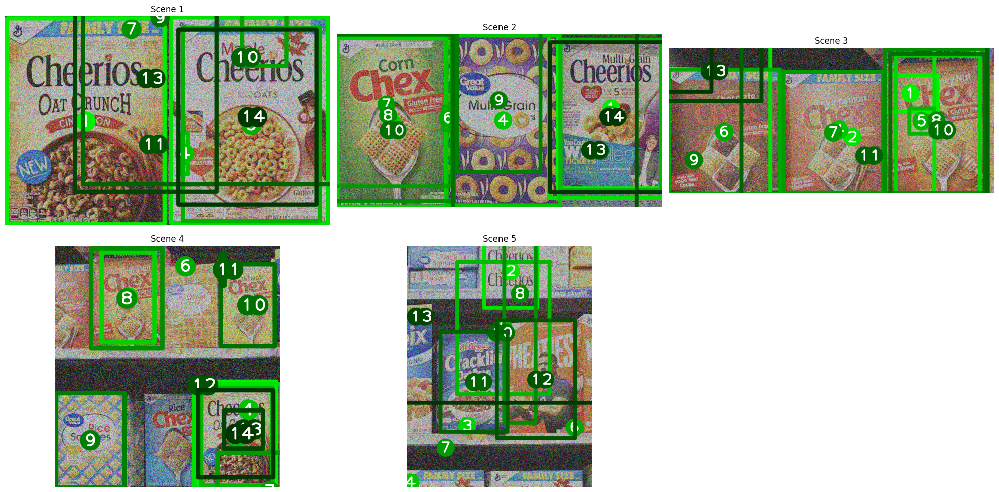

In [211]:
plot_SI_bounding_boxes(results_A)

### Auxiliar mehods used to improve the results

Most of the instances that we have are referring to the same product, so we have to find some heuristic to only keep the correct product.  
First of all some homography will result in bounding box outside the scene image, so we obviously remove them, using:  

In [212]:
def inside(center, image_shape):  # center is (x;y), shape is (rows,columns)
    '''
    used to detect if a point (the center of the bounding box) is inside the scene image
    '''
    return (
        center[0] >= 0
        and center[0] < image_shape[1]
        and center[1] >= 0
        and center[1] < image_shape[0]
        )


def remove_outside_products_SI(results):
    for scene in results:
        for product in results[scene]:
            center=results[scene][product]['geometry']['position']
            if not inside(center,read_noisy_scenes_A[scene].shape):
                results[scene][product]['flag']=False

At this point we should have removed some instances. Let's inspect what we are left with:

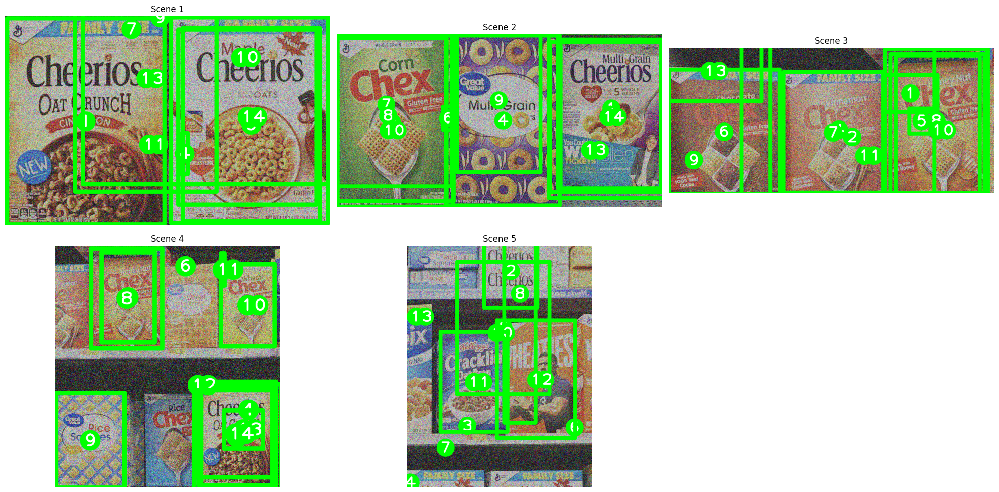

In [214]:
remove_outside_products_SI(results_A)
plot_SI_bounding_boxes(results_A,colorRange=0)

We need something to detect if two bounding boxes insists in the same area. We simply check if the center of a bounding box lands inside another box:

In [215]:
def check_boundings(point, geometry):
    '''
    checks wheter or not a point is inside a bounding box (computed using `get_geometry`)
    '''
    try:
        pointX, pointY = point
        centerX, centerY = geometry['position']
        sizeX = geometry['width']
        sizeY = geometry['height']
        return (
            centerX-sizeX/2 <= pointX 
            and pointX <= centerX+sizeX/2 
            and centerY-sizeY/2 <= pointY 
            and pointY <= centerY+sizeY/2
            )
    except ValueError:
        return False

Whenever we detect two overlapping products we use the previously saved match count and we only keep the product with the most amount of matches found.

In [216]:
def remove_overlapping_products_SI(results, method='overlapping_center', show_concentric_texts=False):
    '''
    Single Instance:
        for every couple of products in the same scene, if two products happen
      to be in the same region, only keep the one with the most matches
    '''
    for scene in results.keys():
        keys = list(results[scene].keys())
        for product1 in keys:
            for product2 in [k for k in keys if k != product1]:
                # this match clause was used to test multiple check methods
                # but we are only left with the working one
                match method:
                    case 'overlapping_center':
                        # tuple (x,y)
                        point = results[scene][product1]["geometry"]["position"]
                        if check_boundings(point, results[scene][product2]["geometry"]):
                            if show_concentric_texts:
                                print(
                                    f'scene {scene}: products {product1} and {product2} are found to be concentric')
                            if results[scene][product1]["match_count"] > results[scene][product2]["match_count"]:
                                # when choosing what instance to remove, we only remove it if the other one isn't removed
                                # this is a safe measure whenever two instances would have the same number of matches
                                # and both of them would be removed
                                if results[scene][product1]['flag']:
                                    results[scene][product2]["flag"] = False
                            else:
                                if results[scene][product2]["flag"]:
                                    results[scene][product1]["flag"] = False
                    case _: pass

### Printing methods

In [217]:
def reflag_single_instance_products(results):
    '''
	Flag to True every product of the results
    '''
    for scene in results.keys():
        keys = list(results[scene].keys())
        for product in keys:
            results[scene][product]['flag'] = True

In [218]:
def display_settings(settings, match_count=None, value=None):
    '''
    print used filters and eventually additional settings
    '''
    aux = [filter for filter in settings if ('matching_settings' in filter.keys() or filter['n_iter'] > 0)]
    print('Denoise settings:')
    display(aux)
    if value:
        print(f'tollerance on template matcher: {value}')
    if match_count:
        print(f'min_match:{match_count}')


def print_single_instances(results: dict, min_match, return_dict=False):
    # variables used to format the string
    max_product_len = max(len(str(product))for scene in results for product in results[scene].keys())
    max_match_len = max(len(str(results[scene][product]["match_count"]))for scene in results for product in results[scene])
    max_x_len = max(len(str(results[scene][product]["geometry"]["position"][0])) for scene in results for product in results[scene] if inside(
        results[scene][product]['geometry']['position'], read_noisy_scenes_A[scene].shape))
    max_y_len = max(len(str(results[scene][product]["geometry"]["position"][1])) for scene in results for product in results[scene] if inside(
        results[scene][product]['geometry']['position'], read_noisy_scenes_A[scene].shape))
    max_width_len = max(len(str(results[scene][product]["geometry"]["width"]))for scene in results for product in results[scene])
    max_height_len = max(len(str(results[scene][product]["geometry"]["height"]))for scene in results for product in results[scene])

    if return_dict:
        results_dict = {}

    for scene in results.keys():
        if return_dict:
            results_dict[scene] = {}
        print(f'Scene {scene}:')
        for product in results[scene].keys():
            if (  # the product must have a certain amount of matches
                    results[scene][product]['match_count'] >= min_match and
                # set to false in `remove_overlapping_products_SI` if refs refers to the same product (they both think to be the same product)
                    results[scene][product]['flag']):
                if return_dict:
                    results_dict[scene][product] = results[scene][product]
                    
                print(f"\tProduct {str(product)+',':<{max_product_len+1}}"
                      # + f" matches: {str(results[scene][product]['match_count'])+',':<{max_match_len+1}}"
                      + f" {{position: ({str(results[scene][product]['geometry']['position'][0])+',':<{max_x_len+1}}"
                      + f" {str(results[scene][product]['geometry']['position'][1])+'),':<{max_y_len}}"
                      + f" width: {str(results[scene][product]['geometry']['width'])+',':<{max_width_len}}"
                      + f" height: {results[scene][product]['geometry']['height']:<{max_height_len-1}}}}")
    if return_dict:
        return results_dict

### RESULTS

These are all the command values usable to decide wich product to remove:
- _MIN_MATCH_COUNT_ to control the minimum number of matches that a product must have in order to be kept;


In [244]:
MIN_MATCH_COUNT = 10

We can finally check our results using the heuristic explained:

In [245]:
display_settings(settings_A,MIN_MATCH_COUNT)

# to be able to try different params without having to
# re-execute the whole matching process
reflag_single_instance_products(results_A) 

# using the heurustic from earlier, using the match_count
remove_overlapping_products_SI(results_A)
final_results_A=print_single_instances(results_A,min_match=MIN_MATCH_COUNT,return_dict=True)

Denoise settings:


[{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
 {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
 {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}}]

min_match:10
Scene 1:
	Product 1,  {position: (412,  538), width: 803,  height: 1050}
	Product 2,  {position: (1247, 532), width: 801,  height: 1048}
Scene 2:
	Product 3,  {position: (304,  493), width: 604,  height: 942 }
	Product 4,  {position: (927,  482), width: 632,  height: 950 }
	Product 5,  {position: (1528, 450), width: 560,  height: 842 }
Scene 3:
	Product 6,  {position: (298,  457), width: 599,  height: 672 }
	Product 7,  {position: (888,  460), width: 539,  height: 652 }
	Product 8,  {position: (1446, 398), width: 558,  height: 779 }
Scene 4:
	Product 1,  {position: (887,  914), width: 376,  height: 505 }
	Product 8,  {position: (350,  257), width: 346,  height: 487 }
	Product 9,  {position: (173,  947), width: 333,  height: 461 }
	Product 10, {position: (938,  290), width: 260,  height: 400 }
Scene 5:
	Product 11, {position: (369,  752), width: 369,  height: 551 }
	Product 12, {position: (711,  738), width: 432,  height: 649 }


### Draw bounding boxes

We can now observe graphically the products found:

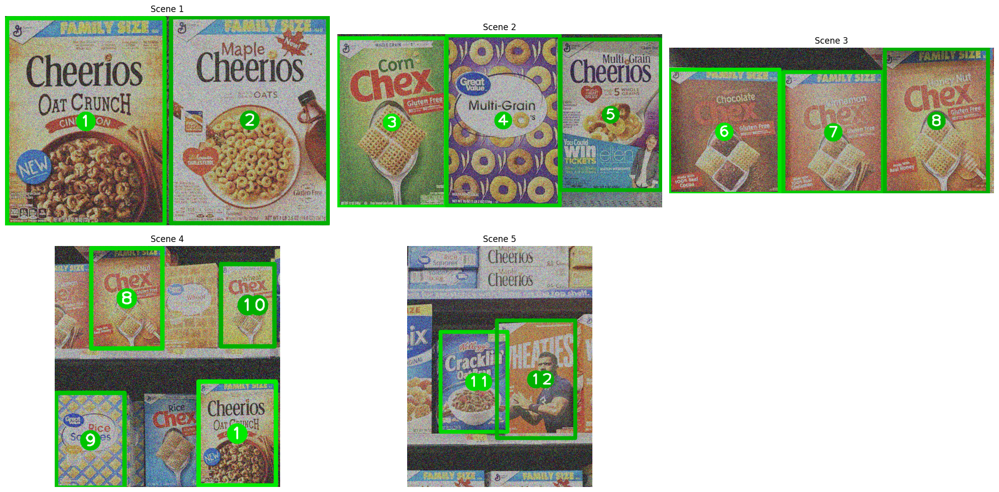

In [246]:
plot_SI_bounding_boxes(final_results_A,colorRange=80)

## TRACK B

Let's apply SIFT on the products, store the keypoints and the descriptors found.

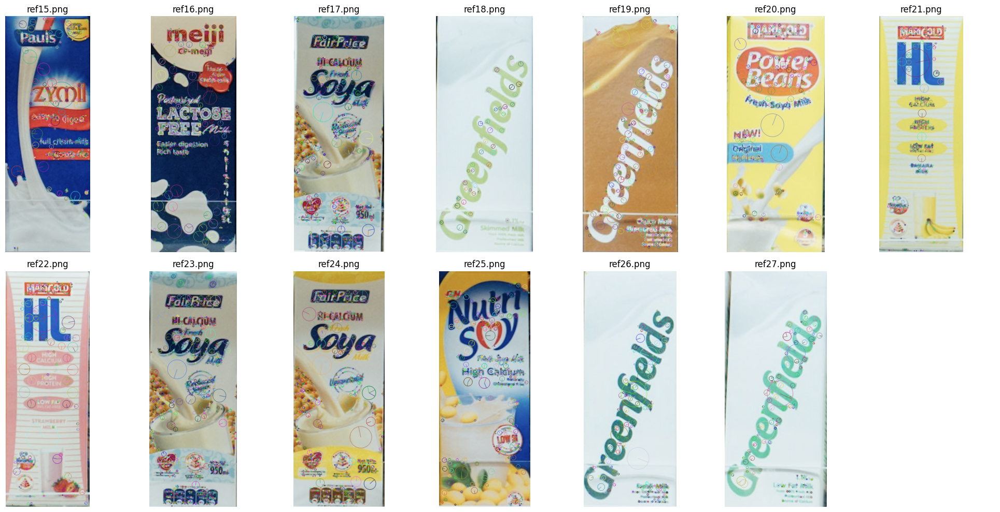

In [272]:
SHOW_KEYPOINTS = True

products_info_B = {}
read_products_B = {}
if SHOW_KEYPOINTS:
    fig, axes = plt.subplots(2, 7, figsize=(20, 10))
    axes = axes.flatten()

for i, product in enumerate(products_B):
    image = cv2.imread(products_B[product])
    read_products_B[product] = image
    sift = cv2.SIFT_create()
    keypoints = sift.detect(image)
    products_info_B[product] = list(sift.compute(image, keypoints))
    if SHOW_KEYPOINTS:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_RGB2BGR))
        axes[i].axis('off')
        axes[i].set_title(products_B[product][len(models_path):])
        if i == len(products_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS:
    plt.tight_layout()
    plt.show()

Initially we tried to use something similar to track A, using the number of matches. Unfortunately SIFT couldn't produce more matches with the actual product rather than a similar one (i.e even if the product was n.27, SIFT would detect n.26 with an higer number of matches).  

Leaving apart the idea of comparing the number of matches, we tried comparing the mean value of the colors of the image. To do so we used the original _ref_ images and the denoised scenes in the bounding box of where the product was found. The results were not great, so we tried to apply some normal noise to the _ref_ and then compare it with the bounding box in the noisy scene. Still no encouraging results.  

The thing we had to do was to then consider the channels of the images separately, because some images would only differ one one channel.  

We can notice that the last two products, for example, have identical shapes and only slightly differ in color.  

We are going to use color histograms, and in particular the differences between them, inspecting the distribution over the color channels of the images. Let's plot a couple of them to check the differences:

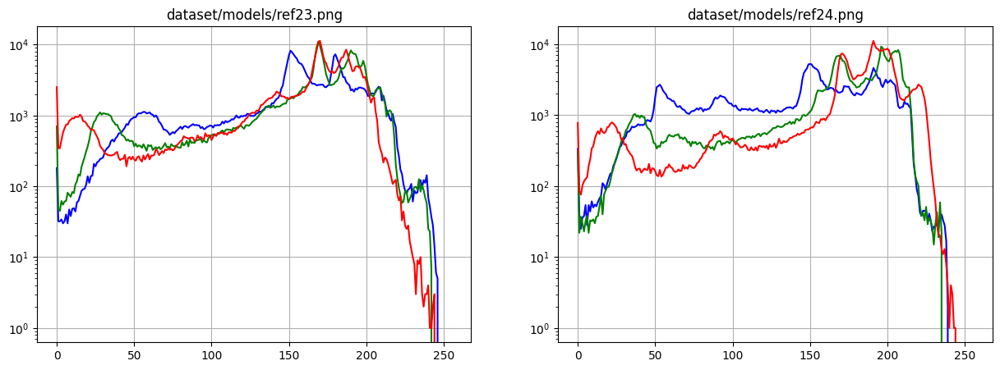

In [264]:
plt.figure(figsize=(15,5))
plt.subplot(121)

first_product=23
chans = cv2.split(read_products_B[first_product])
colors = ("b", "g", "r")
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{products_B[first_product]}')
    
plt.subplot(122)

second_product=24
chans = cv2.split(read_products_B[second_product])
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{products_B[second_product]}')

Let's also check some scenes:

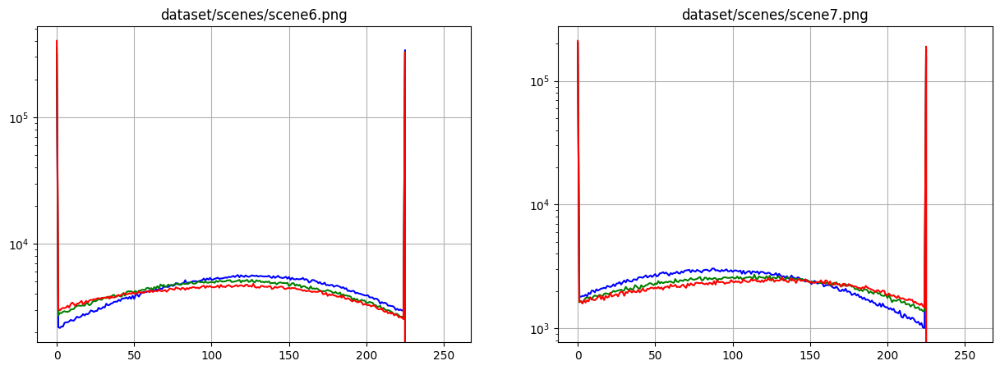

In [265]:
plt.figure(figsize=(15,5))
plt.subplot(121)

first_scene=6
chans = cv2.split(cv2.imread(scenes_B[first_scene]))
colors = ("b", "g", "r")
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{scenes_B[first_scene]}')
    
plt.subplot(122)

second_scene=7
chans = cv2.split(cv2.imread(scenes_B[second_scene]))
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{scenes_B[second_scene]}')

The most important thing we can notice is that the color range of the scenes are smaller (they seem to be between 0 and 225). But since we have to compute the difference between histograms, the two color ranges must be the same.
Let's bring them up to 255 using interpolation. To do so we have prepared this method:

In [225]:
def normalize(image):
    '''
    Normalizes the image to 0-255, 
    calculating new values through linear interpolation
    '''
    max_value = np.max(image)
    new_image = np.interp(image, (0, max_value), (0, 255)).astype('uint8')
    return new_image

As for earlier, we used median filters. This time we do a bit less denoising, the images are smaller and we would lose too many details.

In [226]:
settings_B = [
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
    }
]

In [227]:
SHOW_KEYPOINTS = False
SHOW_FILTERED = False

if SHOW_KEYPOINTS or SHOW_FILTERED:
    fig, axes = plt.subplots(4, 2, figsize=(14, 20))
    axes = axes.flatten()

scenes_info_B = {}
read_scenes_B = {}
read_scenes_noisy_B = {}
for i, scene in enumerate(scenes_B):
    image = cv2.imread(scenes_B[scene])
    read_scenes_noisy_B[scene] = image
    filtered_image = denoise_image(image, settings_B)
    sift = cv2.SIFT_create()
    keypoints = sift.detect(filtered_image)
    filtered_image = normalize(filtered_image)
    read_scenes_B[scene] = filtered_image
    scenes_info_B[scene] = list(sift.compute(filtered_image, keypoints))+[image.shape]
    if SHOW_KEYPOINTS or SHOW_FILTERED:
        printable_image = image
        if SHOW_FILTERED:
            printable_image = filtered_image
        if SHOW_KEYPOINTS:
            printable_image = cv2.drawKeypoints(filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(printable_image, cv2.COLOR_BGR2RGB))
        axes[i].set_title(scenes_B[scene][len(scenes_path):])
        # remove unused subplots
        if i == len(scenes_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS or SHOW_FILTERED:
    plt.tight_layout()
    plt.show()

To compare histograms we can use a lot of different metrics from _openCV_ and the method `cv2.compareHist`. Sperimentally the only working metric was `cv2.HISTCMP_INTERSECT`

In [228]:
def get_histogram_score(product, scene, homography_geometry, method = cv2.HISTCMP_INTERSECT):
    '''
    `method` possibilities: HISTCMP_CORREL, HISTCMP_CHISQR, HISTCMP_INTERSECT, HISTCMP_BHATTACHARYYA, HISTCMP_HELLINGER, HISTCMP_CHISQR_ALT, HISTCMP_KL_DIV
    '''
    # if we want to use an higher number of bins (possibly up to 256(0, 255) it won't be possible to use HISTCMP_CORREL as metric
    # with the images we're using, since they're quite big and the compare method will return nan
    hist_sizes = [16, 16, 16]  
    ranges = [0, 256, 0, 256, 0, 256]
    product_image = read_products_B[product]
    scene_image = read_scenes_B[scene]
    scene_corners = get_angles(homography_geometry)
    
    # Slicing images where product is found
    row_min = min(max(int(min(a[0][1] for a in scene_corners)), 0), scene_image.shape[0]-1)
    row_max = max(min(int(max(a[0][1] for a in scene_corners)), scene_image.shape[0]-1),0)
    col_min = min(max(int(min(a[0][0] for a in scene_corners)), 0), scene_image.shape[1]-1)
    col_max = max(min(int(max(a[0][0] for a in scene_corners)), scene_image.shape[1]-1),0)
    scene_image = scene_image[row_min:row_max+1, col_min:col_max+1]
    
    # Computing histograms
    product_hists = cv2.calcHist([product_image], [0,1,2], None, hist_sizes, ranges)
    scene_hists = cv2.calcHist([scene_image], [0,1,2], None, hist_sizes, ranges)

    # Compare the histograms
    score = cv2.compareHist(product_hists, scene_hists, method)
    
    return score

Initially we tried to use SIFT similarly to track A. The main problem is that due to the noisness of the images some product would never be found using SIFT keypoints, namely product 18. A lot of different filters were tried with zero results. 

We had to find an approach different from SIFT to detect those missing products.

In [229]:
def close_geometries(geom1, geom2, tolerance=40):
    '''
	Compare the distance between the centers.
    (The width and height will be the same due to the template window being of the same size)
    '''
    if (abs(geom1['position'][0] - geom2['position'][0]) <= tolerance and
        abs(geom1['position'][1] - geom2['position'][1]) <= tolerance):
        return True
    return False

In [230]:
def get4corners(top_left, bottom_right):
    '''
    return the 4 corners of a bounfing box, given the
    top left and the bottom right, returned by the template
    mathcer. Output is returned with shape (4,1,2)
    '''
    tl_x, tl_y = top_left
    br_x, br_y = bottom_right
    tr_x, tr_y = br_x, tl_y
    bl_x, bl_y = tl_x, br_y

    return np.array([[tl_x, tl_y], [bl_x, bl_y], [br_x, br_y], [tr_x, tr_y]]).reshape((4, 1, 2))

Finally we can compute our bouding boxes:

In [231]:
PRINT_PROGRESS=False

# treshold for the template matcher. This is relatively small cause of the noisness of the images compared to the refs
MIN_RESULT_VALUE = 0.27
# resulting matches/positions will be stored here
results_B = {}
for scene in scenes_info_B:
    results_B[scene] = {}
    best=0
    geom={}
    prod=0
    # find the best product, in therms of match count, used to get the dimensions of the window
    if PRINT_PROGRESS:print(f'----------SCENE {scene}----------')
    for product in products_info_B:
        try:
            # we had to remove the random factor. We could not figure out what was not working when every execution of the code gave a different output
            matcher = cv2.BFMatcher()
            matches = matcher.knnMatch(products_info_B[product][1], scenes_info_B[scene][1], k=2)
            good = []
            for m, n in matches:
                if m.distance < 0.8*n.distance:
                    good.append(m)
            src_pts = np.float32([products_info_B[product][0][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32([scenes_info_B[scene][0][m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            matchesMask = mask.ravel().tolist()
            h, w = read_products_B[product].shape[:2]
            pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],[w-1, 0]]).reshape(-1, 1, 2)
            dst = np.int32(cv2.perspectiveTransform(pts, M))
            matches=np.sum(matchesMask)
            if matches>best:
                prod=product
                best=matches
                geom=get_geometry(dst)
            if PRINT_PROGRESS:print(f'matches for product {product}: {matches}')
        except: 
            print('\terror on SIFT')
    try:
        w=geom['width']
        h=geom['height']
    except:
        print('error with geom dict')

    if PRINT_PROGRESS:print('=======',f'best product found for scene {scene} is {prod} with {best} matches, size is w:{w}, h:{h}')
    # now use that window to compute template matching
    for product in products_info_B:
        positions_used=[]
        results_B[scene][product] = []
        # resize the product with the found dimension
        try:
            if PRINT_PROGRESS:print(f'matching {product} on scene {scene}')
            resized_product=cv2.resize(read_products_B[product],(w,h),interpolation=1)
            # search the template
            result = cv2.matchTemplate(read_scenes_B[scene], resized_product, cv2.TM_CCOEFF_NORMED)
            locations = np.where(result >= MIN_RESULT_VALUE)
            for loc in zip(*locations[::-1]):
                top_left=loc
                bottom_right=(top_left[0] + resized_product.shape[1], top_left[1] + resized_product.shape[0])
                angles=get4corners(top_left,bottom_right)
                geom=get_geometry(angles)

                # only append this box if it is in a position of a possible next product, 
                # and not in the same spot again
                interrupt=False
                if len(positions_used) > 0:
                    # new method: check if the current geom is 'similar'to one already stored
                    for old_geom in positions_used:
                        if close_geometries(geom,old_geom):
                            interrupt=True
                            break
                        
                if interrupt:
                    continue
                results_B[scene][product].append({
                    'match_count': np.inf,
                    'geometry': geom,
                    'flag':True,
                    'score': get_histogram_score(product,scene, homography_geometry=geom, method=cv2.HISTCMP_INTERSECT)
                    }
                )
                positions_used.append(geom)
            if PRINT_PROGRESS: print(f'trovate {len(results_B[scene][product])} istanze')
        except cv2.error:
            print('\terror on matcher',cv2.error)

	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT


### Auxiliar mehods used by the printing ones

In [232]:
def remove_overlapping_products_MI(results,method='color_center',method_param=75,show_actions = False):
    '''
    Multiple Instance:
	for every couple of instances in the same scene, if two products happen
    to be in the same region, only keep the one with the most matches.

    method='histogram_comparing' means that we search for bounding boxes whith
    center inside another bounding box, if so only keep the one with the best 
    score obtained with the histogram comparing between the window in the scene
    and the product assigned to that section of the image.
    '''
    for scene in results:
        keys=results[scene]
        for product1 in keys:
            for product2 in keys:
                for instance1 in range(len(results[scene][product1])):
                    # if a product is already flagged, do not compute it
                    if not results[scene][product1][instance1]["flag"]: 
                        continue
                    for instance2 in range(len(results[scene][product2])):
                        # if a product is already flagged, do not compute it
                        if not results[scene][product2][instance2]["flag"]:
                            continue
                        # if we check a product with himself we continue
                        if product1==product2 and instance1==instance2:
                            continue
                        # same as in track A, the match was used to test a bunch a strategies
                        match method:
                            case 'histogram_comparing':
                                point=results[scene][product1][instance1]["geometry"]["position"]
                                if check_boundings(point,results[scene][product2][instance2]["geometry"]):
                                    score1 = results[scene][product1][instance1]["score"]
                                    score2 = results[scene][product2][instance2]["score"]
                                    if show_actions:
                                        print(f'{scene}: {product1, point} and {product2,results[scene][product2][instance2]["geometry"]["position"]} concentric:\n1:{score1} - 2: , {score2}')
                                    # compare the histogram score of the two instances
                                    # the abs is due to old metrics that could have been negtive
                                    if np.abs(score1) > np.abs(score2):
                                        # when choosing what instance to remove, we only remove it if the other one isn't removed
                                        # this is a safe measure whenever two instances would have the same score
                                        # and both of them would be removed
                                        if results[scene][product1][instance1]["flag"]:
                                          results[scene][product2][instance2]["flag"] = False
                                    else:
                                        if results[scene][product2][instance2]["flag"]:
                                          results[scene][product1][instance1]["flag"] = False
                            case _:pass
                                

def reflag_products(results):
    for scene in results:
        keys=results[scene]
        for product in keys:
            for instance in range(len(results[scene][product])):
                results[scene][product][instance]['flag'] = True

### Print methods

In [233]:
def print_multiple_instances(results: dict,return_dict=False,order=True):
    max_product_len = max(len(str(product)) for scene in results for product in results[scene])
    max_instance_len = max(len(str(len(results[scene][product]))) for scene in results for product in results[scene])
    max_match_len = max(len(str(product["match_count"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_score_len = max(len(str(product["score"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_x_len = max(len(str(product["geometry"]["position"][0])) for scene in results for products in results[scene] for product in results[scene][products])# if inside(product['geometry']['position'], scenes_info_B[scene-1][2]))
    max_y_len = max(len(str(product["geometry"]["position"][1])) for scene in results for products in results[scene] for product in results[scene][products])# if inside(product['geometry']['position'], scenes_info_B[scene-1][2]))
    max_width_len = max(len(str(product["geometry"]["width"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_height_len = max(len(str(product["geometry"]["height"])) for scene in results for products in results[scene] for product in results[scene][products])

    if return_dict:
        results_dict={}

    for i,scene in enumerate(results):
        if return_dict:
            results_dict[scene]={}
        print(f'Scene {scene}:')
        for products in results[scene]:
            printable_prods=[]
            for instance in results[scene][products]:
                if instance['flag']:
                    printable_prods.append(instance)
            num_inside=len(printable_prods)
            if num_inside>0:
                if return_dict:
                    results_dict[scene][products]=[]
                print(f"\tProduct {products:<{max_product_len}} - {num_inside} instance found:")
                if order: printable_prods = sorted(printable_prods, key=lambda instance: instance['geometry']["position"][0])
                for i,instance in enumerate(printable_prods,1):
                    if return_dict:
                        results_dict[scene][products].append(instance)
                    print(
                    f"\t\tInstance {str(i)+',':<{max_instance_len}}"
                    # + f" matches: {str(instance['match_count'])+',':<{max_match_len+1}}"
                    # + f" score: {str(instance['score'])+',':<{max_score_len+1}}"
                    + f" {{position: ({str(instance['geometry']['position'][0])+',':<{max_x_len+1}}"
                    + f" {str(instance['geometry']['position'][1])+'),':<{max_y_len}}"
                    + f" width: {str(instance['geometry']['width'])+'px,':<{max_width_len}}"
                    + f" height: {str(instance['geometry']['height'])+'px':<{max_height_len-1}}}}"
                    )
    if return_dict:
        return results_dict

### RESULTS

In [234]:
def double_check(results,max_tresh=0.5,instance_tresh=0.81):
    '''
	removes instances of products whose score is lower than some percentage of the maximum score of the scene
    and if it is lower than a certain percentage of the higher score of the instances of the same product
    '''
    for scene in results:
        max_scene_score=max([inst['score'] for p in results[scene] for inst in results[scene][p] if inst['flag']])
        # print(f'scene {scene}, max is {max_scene_score}')
        for product in results[scene]:
            try:
                max_product_score=max([inst['score'] for inst in results[scene][product] if inst['flag']])
            except ValueError:
                continue
            # print(f'max of {product} in {scene} is {max_product_score}')
            for instance in results[scene][product]:
                if instance['score']<max_tresh*max_scene_score or instance['score']<instance_tresh*max_product_score:
                    instance['flag']=False


In [235]:
CHECK_POSITION = True
CHECK_METHOD='histogram_comparing' # 'center_vicinity' or 'overlapping_center' or color_similarity or noisy_color_similarity or histogram_comparing
METHOD_PARAM=75
EXCEEDING_TOLLERANCE=20
MIN_AREA=50_000
            
print('Denoise settings:')
display_settings(settings_B,MIN_RESULT_VALUE)
reflag_products(results_B)
remove_overlapping_products_MI(results_B, method=CHECK_METHOD,method_param=METHOD_PARAM,show_actions=False)
# this double_check method adds some hard treshold to the instances, in order to remove false positives
double_check(results_B,max_tresh=0.5,instance_tresh=0.81)
products_found_B=print_multiple_instances(results_B,True,True)

Denoise settings:
Denoise settings:


[{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
 {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}}]

min_match:0.27
Scene 6:
	Product 15 - 2 instance found:
		Instance 1, {position: (206,  602), width: 327px, height: 905px}
		Instance 2, {position: (590,  542), width: 327px, height: 905px}
Scene 7:
	Product 16 - 2 instance found:
		Instance 1, {position: (820,  460), width: 218px, height: 601px}
		Instance 2, {position: (960,  462), width: 218px, height: 601px}
Scene 8:
	Product 23 - 2 instance found:
		Instance 1, {position: (725,  560), width: 322px, height: 869px}
		Instance 2, {position: (984,  576), width: 322px, height: 869px}
	Product 24 - 1 instance found:
		Instance 1, {position: (1299, 564), width: 322px, height: 869px}
	Product 27 - 1 instance found:
		Instance 1, {position: (263,  580), width: 322px, height: 869px}
Scene 9:
	Product 18 - 2 instance found:
		Instance 1, {position: (126,  314), width: 231px, height: 556px}
		Instance 2, {position: (364,  343), width: 231px, height: 556px}
	Product 19 - 2 instance found:
		Instance 1, {position: (644,  382), width: 231px, hei

### Draw bounding boxes

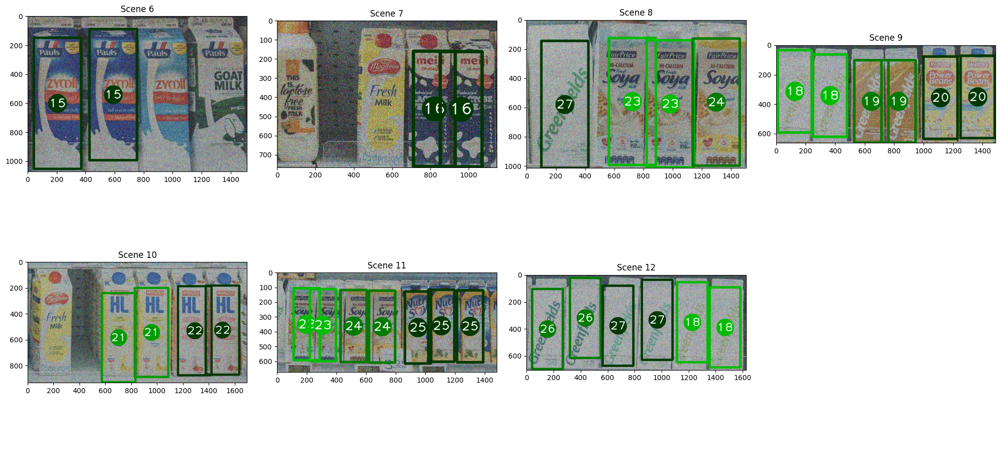

In [236]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()
COLOR_RANGE=200
DRAW_CIRCLES=True
SHOW_DENOISED_SCENES=False
for i, scene in enumerate(products_found_B):
    image=read_scenes_noisy_B[scene]
    if SHOW_DENOISED_SCENES:
        image=read_scenes_B[scene]
    prods=len(products_found_B[scene].keys())
    for c,products in enumerate(products_found_B[scene]):
        for instance in products_found_B[scene][products]:
            points = get_angles(instance['geometry'])
            color=[0,255-COLOR_RANGE+COLOR_RANGE*(prods-(c+1))/prods,0]
            image = cv2.polylines(image, [np.int32(points)], True, color, 15, cv2.LINE_AA)
            text=f'{products}'
            px,py=instance['geometry']['position']
            if DRAW_CIRCLES:
                image=cv2.circle(image,(px,py),65,color,-1)
                text_color=[255]*3
            else: 
                text_color=0
            px-=60
            py+=30
            image=cv2.putText(image,text,(px,py),cv2.FONT_HERSHEY_PLAIN,6,text_color,5)
    axes[i].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'Scene {scene}')
    if i == len(scenes_B)-1:
        for ax in axes[i+1:]:
            ax.axis('off')

plt.tight_layout()
plt.show()